In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!pip install pytorch_pretrained_bert

In [71]:
import os, time, json, re, copy, gc
import itertools, argparse, pickle, random, math
import os.path as osp

from tqdm import tqdm_notebook, tnrange
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
import nltk
from sklearn.utils import shuffle
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# import eli5
# from eli5.lime import TextExplainer

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import LambdaLR, StepLR, MultiStepLR, ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader, Sampler

from pytorch_pretrained_bert import convert_tf_checkpoint_to_pytorch
from pytorch_pretrained_bert import BertTokenizer, BertForSequenceClassification, BertConfig

%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [0]:
USE_GPU = True
dtype = torch.float32
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [0]:
SEED = 2019
path = '/content/'
MODEL_PATH = '/content/drive/My Drive/DL_projects/nlp_jigsaw_bias/'
CONFIG_PATH = '/content/drive/My Drive/DL_projects/nlp_jigsaw_bias/'

MAX_SEQUENCE_LENGTH = 220
batch_size = 16

identity_columns = [
    'male', 'female', 'homosexual_gay_or_lesbian', 'christian', 'jewish',
    'muslim', 'black', 'white', 'psychiatric_or_mental_illness']

aux_columns = ['target', 'severe_toxicity', 'obscene', 'threat', 'insult', 'identity_attack']

label_column = 'target'
pred_column = 'prediction'
text_column = 'comment_text'

# Seed pytorch
def seed_torch(seed=SEED):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

# Convert target and identity columns to booleans    
def convert_dataframe_to_bool(df):
    def convert_to_bool(df, col_name):
        df[col_name] = np.where(df[col_name] >= 0.5, True, False)
    
    bool_df = df.copy()
    for col in [label_column] + identity_columns + aux_columns:
        convert_to_bool(bool_df, col)
    return bool_df

## Load data

### Download data

In [0]:
!mkdir /root/.kaggle
!cp /content/drive/My\ Drive/DL_projects/Data/kaggle.json /root/.kaggle/

In [9]:
!kaggle competitions download -c jigsaw-unintended-bias-in-toxicity-classification -f train.csv

 93% 254M/273M [00:02<00:00, 95.8MB/s]
100% 273M/273M [00:02<00:00, 105MB/s] 


In [10]:
!kaggle competitions download -c jigsaw-unintended-bias-in-toxicity-classification -f test.csv

 58% 7.00M/12.0M [00:00<00:00, 70.4MB/s]
100% 12.0M/12.0M [00:00<00:00, 76.2MB/s]


In [11]:
!unzip train.csv.zip

Archive:  train.csv.zip
  inflating: train.csv               


In [12]:
!unzip test.csv.zip

Archive:  test.csv.zip
  inflating: test.csv                


In [0]:
!rm train.csv.zip test.csv.zip

### Data loader

In [0]:
class Toxic_comments(Dataset):

    def __init__(self, tokenized_comments, targets=None, split=None, maxlen=256):
        self.comments = tokenized_comments
        self.targets = targets
        self.split = split
        assert self.split in {'train', 'valid', 'test'}
        self.maxlen = maxlen

    def __getitem__(self, index):
        comment = self.comments[index]
        if self.targets is not None:
            target = self.targets[index]
            return comment, torch.FloatTensor(target)
        else:
            return comment

    def __len__(self):
        return len(self.comments)

    def get_lens(self):
        lengths = np.fromiter(
            ((min(self.maxlen, len(seq))) for seq in self.comments),
            dtype=np.int32)
        return lengths

    def collate_fn(self, batch):
        """
        Collate function for sequence bucketing
        Note: this need not be defined in this Class, can be standalone.

        :param batch: an iterable of N sets from __getitem__()
        :return: a tensor of comments, and targets
        """

        if self.split in ('train', 'valid'):
            comments, targets = zip(*batch)
        else:
            comments = batch

        lengths = [len(c) for c in comments]
        maxlen = max(lengths)
        padded_comments = []
        for i, c in enumerate(comments):
            padded_comments.append(c+[0]*(maxlen - lengths[i]))

        if self.split in ('train', 'valid'):
            return torch.LongTensor(padded_comments), torch.stack(targets)
        else:
            return torch.LongTensor(padded_comments)

class BucketSampler(Sampler):

    def __init__(self, data_source, sort_lens, bucket_size=None, batch_size=1024, shuffle_data=True):
        super().__init__(data_source)
        self.shuffle = shuffle_data
        self.batch_size = batch_size
        self.sort_lens = sort_lens
        self.bucket_size = bucket_size if bucket_size is not None else len(sort_lens)
        self.weights = None

        if not shuffle_data:
            self.index = self.prepare_buckets()
        else:
            self.index = None

    def set_weights(self, weights):
        assert weights >= 0
        total = np.sum(weights)
        if total != 1:
            weights = weights / total
        self.weights = weights

    def __iter__(self):
        indices = None
        if self.weights is not None:
            total = len(self.sort_lens)
            indices = np.random.choice(total, (total,), p=self.weights)
        if self.shuffle:
            self.index = self.prepare_buckets(indices)
        return iter(self.index)

    def get_reverse_indexes(self):
        indexes = np.zeros((len(self.index),), dtype=np.int32)
        for i, j in enumerate(self.index):
            indexes[j] = i
        return indexes

    def __len__(self):
        return len(self.sort_lens)

    def prepare_buckets(self, indices=None):
        lengths = - self.sort_lens
        assert self.bucket_size % self.batch_size == 0 or self.bucket_size == len(lengths)

        if indices is None:
            if self.shuffle:
                indices = shuffle(np.arange(len(lengths), dtype=np.int32))
                lengths = lengths[indices]
            else:
                indices = np.arange(len(lengths), dtype=np.int32)

        #  bucket iterator
        def divide_chunks(l, n):
            if n == len(l):
                yield np.arange(len(l), dtype=np.int32), l
            else:
                # looping till length l
                for i in range(0, len(l), n):
                    data = l[i:i + n]
                    yield np.arange(i, i + len(data), dtype=np.int32), data

        new_indices = []
        extra_batch_idx = None
        for chunk_index, chunk in divide_chunks(lengths, self.bucket_size):
            # sort indices in bucket by descending order of length
            indices_sorted = chunk_index[np.argsort(chunk)]

            batch_idxes = []
            for _, batch_idx in divide_chunks(indices_sorted, self.batch_size):
                if len(batch_idx) == self.batch_size:
                    batch_idxes.append(batch_idx.tolist())
                else:
                    assert extra_batch_idx is None
                    assert batch_idx is not None
                    extra_batch_idx = batch_idx.tolist()

            # shuffling batches within buckets
            if self.shuffle:
                batch_idxes = shuffle(batch_idxes)
            for batch_idx in batch_idxes:
                new_indices.extend(batch_idx)

        if extra_batch_idx is not None:
            new_indices.extend(extra_batch_idx)

        if not self.shuffle:
            self.original_indices = np.argsort(indices_sorted).tolist()
        return indices[new_indices]

def prepare_loader(x, y=None, batch_size=1024, split=None):
    assert split in {'train', 'valid', 'test'}
    dataset = Toxic_comments(x, y, split, MAX_SEQUENCE_LENGTH)
    if split == 'train':
        sampler = BucketSampler(dataset, dataset.get_lens(),
                                bucket_size=batch_size*30, batch_size=batch_size)
        return DataLoader(dataset, batch_size=batch_size, sampler=sampler,
                          collate_fn=dataset.collate_fn)
    else:
        sampler = BucketSampler(dataset, dataset.get_lens(),
                                batch_size=batch_size, shuffle_data=False)
        return DataLoader(dataset, batch_size=batch_size, sampler=sampler,
                          collate_fn=dataset.collate_fn), sampler.original_indices

### Loading and preprocessing

In [0]:
def convert_lines(texts, max_seq_length, tokenizer):
    max_seq_length -= 2
    all_tokens = []

    for text in texts:
        tokens = tokenizer.tokenize(text)
        if len(tokens) > max_seq_length:
            tokens = tokens[-max_seq_length:]
        one_token = tokenizer.convert_tokens_to_ids(["[CLS]"]+tokens+["[SEP]"])
        all_tokens.append(one_token)

    return np.array(all_tokens)

def train_val_split(train_x, train_y):
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)
    cv_indices = [(tr_idx, val_idx) for tr_idx, val_idx in kf.split(train_x, train_y)]
    return cv_indices

def load_and_preproc():
    train_df = pd.read_csv(path+'train.csv')
    test_df = pd.read_csv(path+'test.csv')
    train_df[identity_columns] = train_df[identity_columns].copy().fillna(0)

    sample_weights = np.ones(len(train_df))
    sample_weights += train_df[identity_columns].values.sum(1) * 3
    sample_weights += train_df[label_column].values * 8
    sample_weights /= sample_weights.max()
    train_tars = train_df[[label_column]+aux_columns+identity_columns].values
    train_tars = np.hstack([train_tars, sample_weights[:,None]]).astype('float32')

    train_df = convert_dataframe_to_bool(train_df)
    df = train_df[[label_column]+identity_columns].copy()
    df[label_column] = df[label_column].astype('uint8')

    return train_df[text_column], train_tars, df

In [17]:
train_seq, train_tars, trn_df = load_and_preproc()
cv_indices = train_val_split(train_seq, (train_tars[:,0]>=0.5).astype(int))
trn_idx, val_idx = cv_indices[-1]

print('tokenizing...')
t0 = time.time()
tokenizer = BertTokenizer.from_pretrained(MODEL_PATH, do_lower_case=True)
x_val = convert_lines(train_seq[val_idx], MAX_SEQUENCE_LENGTH, tokenizer)
print('tokenizing complete in {:.0f} seconds.'.format(time.time()-t0))

tokenizing...
tokenizing complete in 326 seconds.


In [0]:
y_val = train_tars[val_idx]
val_df = trn_df.iloc[val_idx]
val_loader, val_original_indices = prepare_loader(x_val, y_val, batch_size, split='valid')

del train_seq, train_tars, trn_df

## Load model

In [19]:
# BERT configuration file for model loading
bert_config = BertConfig(CONFIG_PATH + 'bert_config.json')

# model setup
print("Building model...")
model = BertForSequenceClassification(bert_config, num_labels=16)
model = model.to(device)

Building model...


In [20]:
models = torch.load(MODEL_PATH+'bert_models.pt')['model']
model.load_state_dict(models[list(models.keys())[-1]])

<All keys matched successfully>

In [23]:
torch.cuda.empty_cache()
print(str(torch.cuda.memory_allocated(device)/1000000 ) + 'M')
print(str(torch.cuda.memory_cached(device)/1000000 ) + 'M')

878.222336M
966.787072M


## Evaluation

In [0]:
SUBGROUP_AUC = 'subgroup_auc'
BPSN_AUC = 'bpsn_auc'  # stands for background positive, subgroup negative
BNSP_AUC = 'bnsp_auc'  # stands for background negative, subgroup positive

def compute_auc(y_true, y_pred):
    try:
        return roc_auc_score(y_true, y_pred)
    except ValueError:
        return np.nan

def compute_subgroup_auc(df, subgroup, label, pred_column):
    subgroup_examples = df[df[subgroup]]
    return compute_auc(subgroup_examples[label], subgroup_examples[pred_column])

def compute_bpsn_auc(df, subgroup, label, pred_column):
    """Computes the AUC of the within-subgroup negative examples and the background positive examples."""
    subgroup_negative_examples = df[df[subgroup] & ~df[label]]
    non_subgroup_positive_examples = df[~df[subgroup] & df[label]]
    examples = subgroup_negative_examples.append(non_subgroup_positive_examples)
    return compute_auc(examples[label], examples[pred_column])

def compute_bnsp_auc(df, subgroup, label, pred_column):
    """Computes the AUC of the within-subgroup positive examples and the background negative examples."""
    subgroup_positive_examples = df[df[subgroup] & df[label]]
    non_subgroup_negative_examples = df[~df[subgroup] & ~df[label]]
    examples = subgroup_positive_examples.append(non_subgroup_negative_examples)
    return compute_auc(examples[label], examples[pred_column])

def compute_bias_metrics_for_model(dataset,
                                   subgroups,
                                   model,
                                   label_col):
    """Computes per-subgroup metrics for all subgroups and one model."""
    records = []
    for subgroup in subgroups:
        record = {
            'subgroup': subgroup,
            'subgroup_size': len(dataset[dataset[subgroup]])
        }
        record[SUBGROUP_AUC] = compute_subgroup_auc(dataset, subgroup, label_col, model)
        record[BPSN_AUC] = compute_bpsn_auc(dataset, subgroup, label_col, model)
        record[BNSP_AUC] = compute_bnsp_auc(dataset, subgroup, label_col, model)
        records.append(record)
    return pd.DataFrame(records).sort_values('subgroup_auc', ascending=True)

def calculate_overall_auc(df, pred_col, label_col):
    true_labels = df[label_col]
    predicted_labels = df[pred_col]
    return roc_auc_score(true_labels, predicted_labels)

def power_mean(series, p):
    total = sum(np.power(series, p))
    return np.power(total / len(series), 1 / p)

def get_final_metric(bias_df, overall_auc, POWER=-5, OVERALL_MODEL_WEIGHT=0.25):
    bias_score = np.average([
        power_mean(bias_df[SUBGROUP_AUC], POWER),
        power_mean(bias_df[BPSN_AUC], POWER),
        power_mean(bias_df[BNSP_AUC], POWER)
    ])
    return (OVERALL_MODEL_WEIGHT * overall_auc) + ((1 - OVERALL_MODEL_WEIGHT) * bias_score)

In [0]:
def eval_model(model, data_loader, mode='test'):
    assert mode in ('val', 'test')
    model.eval()
    test_scores = []
    with torch.no_grad():
        for x in data_loader:
            if mode=='val': x = x[0]
            x = x.to(device=device, dtype=torch.long)
            score = torch.sigmoid(model(x, attention_mask=(x>0)))[:,0]
            test_scores.append(score.cpu().numpy())
    return np.concatenate(test_scores)

In [0]:
%%time
val_scores = eval_model(model, val_loader, mode='val')[val_original_indices]
torch.cuda.empty_cache()

CPU times: user 9min 13s, sys: 5min 3s, total: 14min 17s
Wall time: 14min 17s


In [0]:
val_df[pred_column] = val_scores
val_df.head()

,target,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness,prediction
13,1,False,False,False,False,False,False,False,False,False,0.638812
32,0,False,False,False,False,False,False,False,False,False,0.008642
125,0,False,False,False,False,False,False,False,False,False,0.085921
138,0,False,False,False,False,False,False,False,False,False,0.019225
144,0,False,False,False,False,False,False,False,False,False,0.029236


In [0]:
bias_metrics_df = compute_bias_metrics_for_model(val_df, identity_columns, pred_column, label_column)
bias_metrics_df

,bnsp_auc,bpsn_auc,subgroup,subgroup_auc,subgroup_size
2,0.960143,0.906766,homosexual_gay_or_lesbian,0.861303,499
7,0.962107,0.908016,white,0.865744,1235
5,0.955534,0.931438,muslim,0.882272,1060
4,0.935758,0.956815,jewish,0.884707,378
6,0.968074,0.905575,black,0.888128,756
1,0.951612,0.959908,female,0.927436,2625
0,0.958575,0.958583,male,0.936768,2262
3,0.947802,0.973108,christian,0.947936,2008
8,0.968639,0.953669,psychiatric_or_mental_illness,0.948393,256


In [0]:
get_final_metric(bias_metrics_df, calculate_overall_auc(val_df, pred_column, label_column))

0.9414270277012564

## Visualization

In [0]:
l_dtype = torch.cuda.LongTensor
f_dtype = torch.cuda.FloatTensor

def preprocessing(string):
    return convert_lines([string], MAX_SEQUENCE_LENGTH, tokenizer)

def deprocessing(tokens):
    return ' '.join([tokenizer.ids_to_tokens[i] for i in tokens])

# forward propagation for inference
def get_preds(x, net, class_label):
    net.eval()
    logit = net(x)
    prob = torch.sigmoid(logit[:,class_label]).detach().cpu().numpy()
    return prob

def plot_attention(sent, intensity, figsize=(6,3), title=None, show_text=False, **kwargs):
    fig, (ax1,ax2) = plt.subplots(nrows=2, sharex=True, figsize=figsize)
    
    x = list(range(len(sent.split())))
    y = intensity
    extent = [x[0]-(x[1]-x[0])/2., x[-1]+(x[1]-x[0])/2., 0, 1]
    
    if title is not None:
        ax1.set_title(title, color='w')
    
    ax1.imshow(y[None,:], extent=extent, **kwargs)
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.set_xlim(extent[0], extent[1])
    if show_text:
        for i in range(len(y)):
            text = ax1.text(i, 0, sent.split()[i], ha="center", va="bottom", color="k")

    ax2.plot(x,y)
    ax2.set_xlabel('Word position')
    ax2.set_ylabel('Attentive intensity')
    ax2.tick_params(axis='x')
    ax2.tick_params(axis='y')

    plt.tight_layout()
    plt.show()

In [0]:
def compute_attention(feature_blob, attn_module, attention_mask):
    """
    feature_blob: tensor with size (1, T, 768)
    attn_module: the next BertAttention module
    """
    attn_module.eval()

    mixed_query_layer = attn_module.query(feature_blob)
    mixed_key_layer = attn_module.key(feature_blob)
    mixed_value_layer = attn_module.value(feature_blob)

    query_layer = attn_module.transpose_for_scores(mixed_query_layer)   # (1, 12, T, 64)
    key_layer = attn_module.transpose_for_scores(mixed_key_layer)
    value_layer = attn_module.transpose_for_scores(mixed_value_layer)

    # Take the dot product between "query" and "key" to get the raw attention scores.
    attention_scores = torch.matmul(query_layer, key_layer.transpose(-1, -2))   # (1, 12, T, T)
    attention_scores = attention_scores / math.sqrt(attn_module.attention_head_size)
    # Apply the attention mask is (precomputed for all layers in BertModel forward() function)
    attention_scores = attention_scores + attention_mask

    # Normalize the attention scores to probabilities.
    attention_probs = nn.Softmax(dim=-1)(attention_scores)

    # This is actually dropping out entire tokens to attend to, which might
    # seem a bit unusual, but is taken from the original Transformer paper.
    attention_probs = attn_module.dropout(attention_probs)

    return attention_probs.detach().cpu().numpy()   # (1, 12, T, T)

In [147]:
sample_str = """
My thoughts are that people should stop being stupid and ignorant. Climate change scientifically proven. It isn't a debate.
"""

seq = l_dtype(preprocessing(sample_str))
sent = deprocessing(seq.tolist()[0])
print(get_preds(seq, model, 0).item())
print(sent)

0.8394899964332581
[CLS] my thoughts are that people should stop being stupid and ignorant . climate change scientific ##ally proven . it isn ' t a debate . [SEP]


In [0]:
bert_layers = list(model.bert.encoder.layer.children())
modul = bert_layers[-1].attention.self

features, pooled = model.bert(seq, attention_mask=(seq>0))
features.append(pooled)

attn_probs = compute_attention(features[-2], modul, attention_mask=(seq>0))

[CLS] my thoughts are that people should stop being stupid and ignorant . climate change scientific ##ally proven . it isn ' t a debate . [SEP]


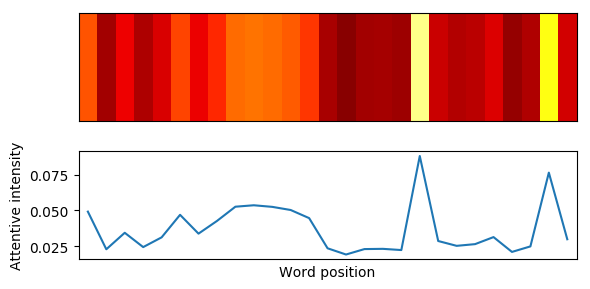

In [158]:
print(sent)
plot_attention(sent, attn_probs[0,0,0], aspect="auto", vmin=0.0, vmax=0.1, cmap="hot")

[CLS] my thoughts are that people should stop being stupid and ignorant . climate change scientific ##ally proven . it isn ' t a debate . [SEP]


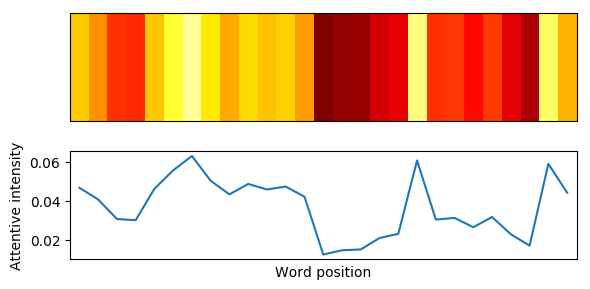

In [168]:
print(sent)
plot_attention(sent, attn_probs[0,3,0], aspect="auto", vmin=0.0, vmax=0.07, cmap="hot")

In [66]:
sample_str = """
I am a gay woman.
"""

seq = l_dtype(preprocessing(sample_str))
sent = deprocessing(seq.tolist()[0])
print(get_preds(seq, model, 0).item())
print(sent)

0.2748848795890808
[CLS] i am a gay woman . [SEP]


In [0]:
bert_layers = list(model.bert.encoder.layer.children())
modul = bert_layers[-1].attention.self

features, pooled = model.bert(seq, attention_mask=(seq>0))
features.append(pooled)

attn_probs = compute_attention(features[-2], modul, attention_mask=(seq>0))

[CLS] i am a gay woman . [SEP]


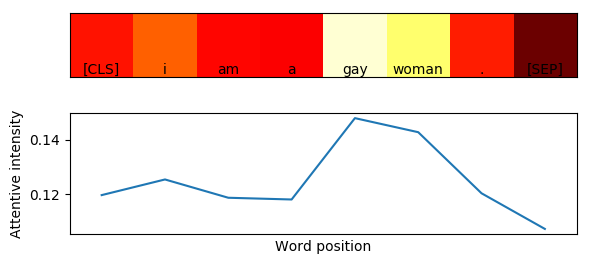

In [145]:
print(sent)
plot_attention(sent, attn_probs[0,0,0], aspect="equal", vmin=0.1, vmax=0.15, cmap="hot")

[CLS] i am a gay woman . [SEP]


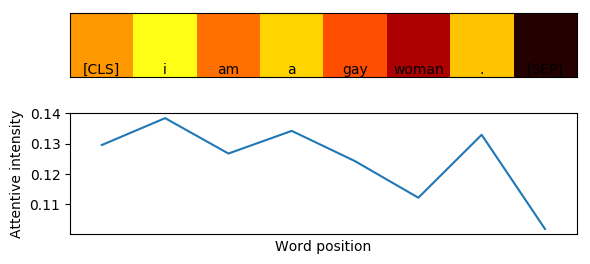

In [146]:
print(sent)
plot_attention(sent, attn_probs[0,3,0], aspect="equal", vmin=0.1, vmax=0.15, cmap="hot")

### Using lime and eli5

In [0]:
!pip install lime
!pip install eli5

In [40]:
import lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer

import eli5
from eli5.lime import TextExplainer

Using TensorFlow backend.


In [0]:
def predict_pipeline(raw_strings):
    """
    Input: list of d strings 
    Return: numpy array of shape (d, 2)
    """
    comments = [preprocessing(s) for s in raw_strings]
    ps = [get_preds(l_dtype(c), model, 0).item() for c in comments]
    return np.array([[1-p, p] for p in ps])

In [0]:
explainer = LimeTextExplainer(class_names=['non-toxic', 'toxic'])
te = TextExplainer(random_state=SEED)

In [62]:
sample_str = """
My thoughts are that people should stop being stupid and ignorant. Climate change scientifically proven. It isn't a debate.
"""

exp = explainer.explain_instance(sample_str, predict_pipeline, num_features=6)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


In [63]:
get_preds(l_dtype(preprocessing(sample_str)), model, 0).item()

0.8394899964332581

In [64]:
exp.show_in_notebook(text=True)

In [0]:
## LSTM based model

In [65]:
te.fit(sample_str, predict_pipeline)
te.show_prediction(target_names=['non-toxic', 'toxic'])

In [0]:
## LSTM based model

In [58]:
%%time
sample_str = """
This is a great story. Man. I wonder if the person who yelled "shut the fuck up!" at him ever heard it.
"""

exp = explainer.explain_instance(sample_str, predict_pipeline, num_features=6)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


CPU times: user 2min 6s, sys: 804 ms, total: 2min 7s
Wall time: 2min 6s


In [59]:
get_preds(l_dtype(preprocessing(sample_str)), model, 0).item()

0.700899600982666

In [60]:
exp.show_in_notebook(text=True)

In [0]:
## LSTM based model

In [61]:
te.fit(sample_str, predict_pipeline)
te.show_prediction(target_names=['non-toxic', 'toxic'])

In [0]:
## LSTM based model

In [0]:
sample_str = """
I am a gay woman.
"""

exp = explainer.explain_instance(sample_str, predict_pipeline, num_features=6)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


In [0]:
get_preds(l_dtype(preprocessing(sample_str)), model, 0).item()

0.2748848795890808

In [0]:
exp.show_in_notebook(text=True)

In [0]:
## LSTM based model

In [0]:
te.fit(sample_str, predict_pipeline)
te.show_prediction(target_names=['non-toxic', 'toxic'])t

In [0]:
## LSTM based model

In [54]:
sample_str = """
No. You made it about race when you chose to act like some 0.3% of murders are different from the other 99.6 %, more worthy of protest, and there was absolutely nothing else different about those 0.3%. Only seriously extreme racists ever use the term 'race card'. Complaining about the race card is proof of being a racist. Non racists don't have any fear of discussing the influence of race on any topic. And only the really dumbest of the dumb use the word 'libtard'. Note how I discussed the issue in terms of numbers, facts, empirical reality untimely by emotion or group loyalty. i didn't 'bring race into it', I mathematically proved it could be about nothing else. And what could you offer in return? Any rational thoughts? Improved numbers? A flaw in my calculation? Nope. All you have is a silly attempt at a personal insult. So I've won this debate by all measures. Just hush now. You're embarrassing yourself.
"""

exp = explainer.explain_instance(sample_str, predict_pipeline, num_features=6)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


In [55]:
get_preds(l_dtype(preprocessing(sample_str)), model, 0).item()

0.6051257848739624

In [56]:
exp.show_in_notebook(text=True)

In [0]:
## LSTM based model

In [57]:
te.fit(sample_str, predict_pipeline)
te.show_prediction(target_names=['non-toxic', 'toxic'])

In [0]:
## LSTM based model